# Import Libraries and Load Sample Data via Dataset, Dataloader

In [6]:

import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

import torch
from torchvision import transforms
from torch.utils.data import DataLoader

In [7]:
class Dataset(torch.utils.data.Dataset):

    def __init__(self, data_dir, transform=None):
        self.data_dir = data_dir
        self.transform = transform

        data = os.listdir(self.data_dir)

        img_list, label_list = [], []
        for f in sorted(data):
            if 'sample' in f:
                img_list.append(f) 
            elif 'label' in f:
                label_list.append(f)

        self.img_list = img_list
        self.label_list = label_list

    def __len__(self):
        return len(self.label_list)

    def __getitem__(self, index):

        input = Image.open(os.path.join(self.data_dir, self.img_list[index]))
        label = Image.open(os.path.join(self.data_dir, self.label_list[index])).convert("L")
        
        input, label = np.array(input), np.array(label)

        input, label = input/255.0, label/255.0
        input, label = input.astype(np.float32), label.astype(np.float32)

        if label.ndim == 2:
            label = label[:, :, np.newaxis]
        if input.ndim == 2:
            input = input[:, :, np.newaxis]

        data = {'input': input, 'label': label}

        if self.transform:
            data = self.transform(data)

        return data

class ToTensor(object):
    def __call__(self, data):
        label, input = data['label'], data['input']

        label = label.transpose((2, 0, 1)).astype(np.float32)
        input = input.transpose((2, 0, 1)).astype(np.float32)

        data = {'label': torch.from_numpy(label), 'input': torch.from_numpy(input)}

        return data

class Normalization(object):
    def __init__(self, mean=0.5, std=0.5):
        self.mean = mean
        self.std = std

    def __call__(self, data):
        label, input = data['label'], data['input']

        input = (input - self.mean) / self.std

        data = {'label': label, 'input': input}

        return data

class RandomFlip(object):
    def __call__(self, data):
        label, input = data['label'], data['input']

        if np.random.rand() > 0.5:
            label = np.fliplr(label)
            input = np.fliplr(input)

        if np.random.rand() > 0.5:
            label = np.flipud(label)
            input = np.flipud(input)

        data = {'label': label, 'input': input}

        return data

In [9]:
data_dir = '/mnt/hdd1/c-MET_datasets/Lung_c-MET IHC_scored/DL-based_tumor_seg_dataset'

batch_size = 16

transform_train = transforms.Compose([Normalization(mean=0.5, std=0.5), RandomFlip(), ToTensor()])
dataset_train = Dataset(data_dir=os.path.join(data_dir,'train'),transform = transform_train)

loader_train = DataLoader(dataset_train, batch_size = len(dataset_train), shuffle = False)

In [10]:
for batch, data in enumerate(loader_train,1): # 1은 뭐니 > index start point
        # forward
        label = data['label']  # 데이터 device로 올리기     
        inputs = data['input']

        if batch == 1:
                break

In [11]:
inputs.size()

torch.Size([720, 3, 256, 256])

# RandomFlip

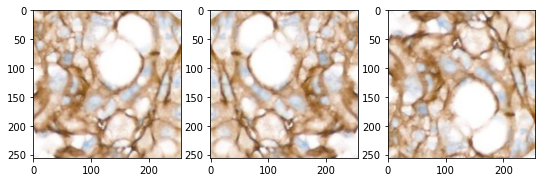

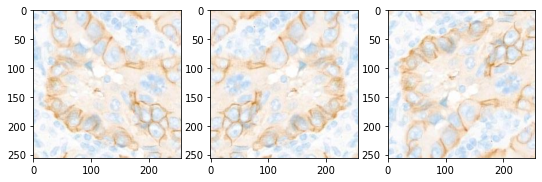

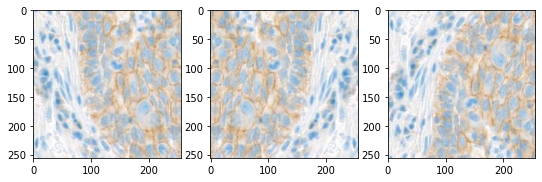

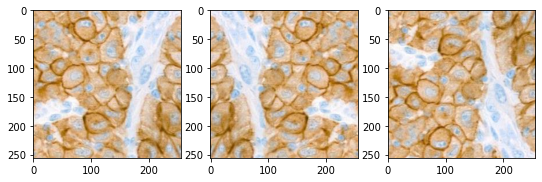

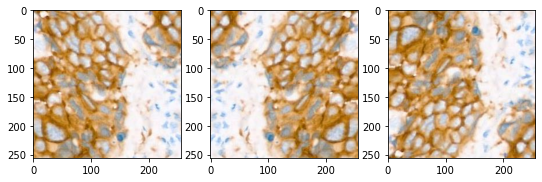

...

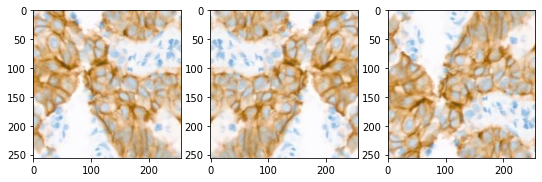

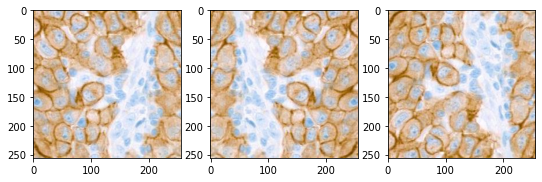

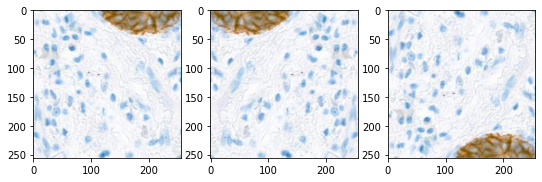

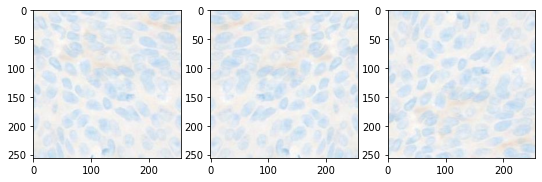

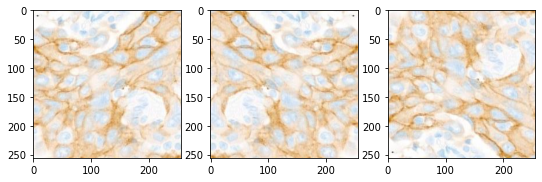

In [17]:
fn_tonumpy = lambda x : x.to('cpu').detach().numpy().transpose(1, 2, 0)
fn_denorm = lambda x, mean, std : (x*std) + mean

for i in range(len(inputs)):

    img = fn_denorm(fn_tonumpy(inputs[i]), mean=0.5, std=0.5)

    plt.figure(figsize = (9, 6))

    plt.subplot(1, 3, 1)
    plt.imshow(img)
    
    plt.subplot(1, 3, 2)
    plt.imshow(np.fliplr(img))

    plt.subplot(1, 3, 3)
    plt.imshow(np.flipud(img))
    plt.show()


# Partial non-tissue

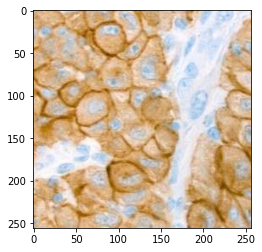

In [70]:
fn_tonumpy = lambda x : x.to('cpu').detach().numpy().transpose(1, 2, 0)
fn_denorm = lambda x, mean, std : (x*std) + mean

i = 3
img = fn_denorm(fn_tonumpy(inputs[i]), mean=0.5, std=0.5)
lab = fn_tonumpy(label[i])

plt.imshow(img)
plt.show()

In [71]:
0.96*255 + 0.01*255*np.random.randn()

243.43807923106846

1


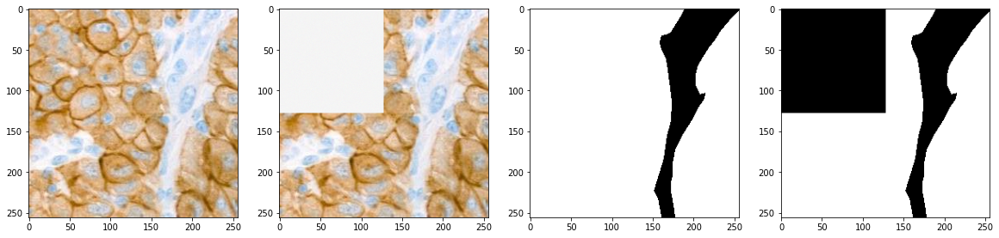

In [76]:
height, width, ch = img.shape
half_size = height//2 
img_ = img.copy()
lab_ = lab.copy()
non_tissue = np.clip((0.96*np.ones((half_size, half_size, ch)) + 0.005*np.random.randn(half_size, half_size, ch)), a_min = 0, a_max = 1)
non_tissue_mask = np.zeros((half_size, half_size, 1))

rotation = np.random.randint(1, 5) 
if rotation == 1:
    img_[:half_size, :half_size, :] = non_tissue
    lab_[:half_size, :half_size, :] = non_tissue_mask
elif rotation == 2:
    img_[:half_size, half_size:, :] = non_tissue
    lab_[:half_size, half_size:, :] = non_tissue_mask
elif rotation == 3:
    img_[half_size:, :half_size, :] = non_tissue
    lab_[half_size:, :half_size, :] = non_tissue_mask
elif rotation == 4:
    img_[:half_size, :half_size, :] = non_tissue
    lab_[:half_size, :half_size, :] = non_tissue_mask

print(rotation)

plt.figure(figsize = (20, 6))

plt.subplot(1, 4, 1)
plt.imshow(img)

plt.subplot(1, 4, 2)
plt.imshow(img_)

plt.subplot(1, 4, 3)
plt.imshow(lab, cmap = 'gray')

plt.subplot(1, 4, 4)
plt.imshow(lab_, cmap = 'gray')
plt.show()

In [ ]:
class PartialNonTissue(object):
    def __call__(self, data):
        label, input = data['label'], data['input']

        size, size, ch = input.shape
        half_size = size//2 

        non_tissue = np.clip((0.96*np.ones((half_size, half_size, ch)) + \
                             0.005*np.random.randn(half_size, half_size, ch)), 
                             a_min = 0, a_max = 1)
        non_tissue_mask = np.zeros((half_size, half_size, 1))

        if np.random.randint(1, 5) == 1:
            rotation = np.random.randint(1, 5) 
            if rotation == 1:
                input[:half_size, :half_size, :] = non_tissue
                label[:half_size, :half_size, :] = non_tissue_mask
            elif rotation == 2:
                input[:half_size, half_size:, :] = non_tissue
                label[:half_size, half_size:, :] = non_tissue_mask
            elif rotation == 3:
                input[half_size:, :half_size, :] = non_tissue
                label[half_size:, :half_size, :] = non_tissue_mask
            elif rotation == 4:
                input[:half_size, :half_size, :] = non_tissue
                label[:half_size, :half_size, :] = non_tissue_mask

        data = {'label': label, 'input': input}

        return data

# RGB to Gray scale + Hematoxylin

## 1. h - h.min()/(h.max()-h.min())

sample dataset

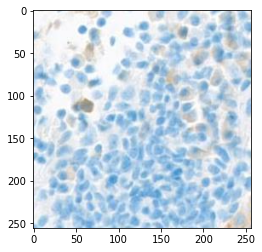

In [57]:
fn_tonumpy = lambda x : x.to('cpu').detach().numpy().transpose(1, 2, 0)
fn_denorm = lambda x, mean, std : (x*std) + mean

i = np.random.randint(len(dataset_train))
img = fn_denorm(fn_tonumpy(inputs[i]), mean=0.5, std=0.5)
lab = fn_tonumpy(label[i])

plt.imshow(img)
plt.show()

In [58]:
import cv2
import skimage.color

In [59]:
img.max(), img.min(), img.mean()

(1.0, 0.26666668, 0.836838)

In [60]:
g = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

hed = skimage.color.separate_stains(img, skimage.color.hed_from_rgb)
h = hed[:,:,0]

In [61]:
g.max(), g.min(), g.mean()

(1.0, 0.485302, 0.8254865)

In [62]:
h.max(), h.min(), h.mean()

(0.16784195773199442, -0.0045914910660540985, 0.033497882505936646)

In [63]:
h_n = (h- h.min())/(h.max()-h.min())

In [64]:
h_n.max(), h_n.min(), h_n.mean()

(1.0, 0.0, 0.2208931842255295)

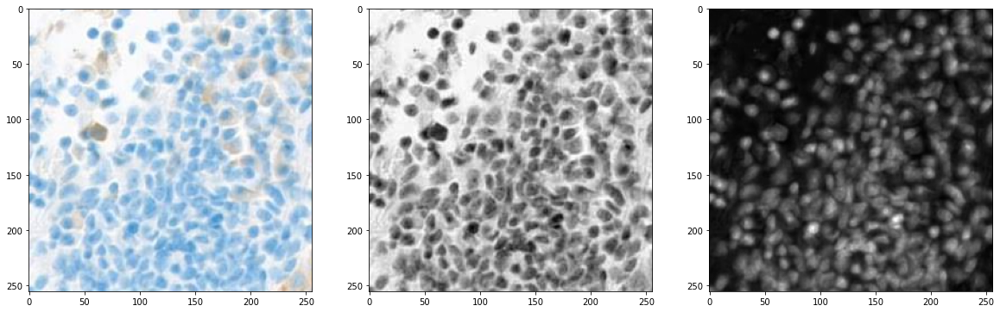

In [66]:
plt.figure(figsize= (20, 10))
plt.subplot(1, 3, 1)
plt.imshow(img)

plt.subplot(1, 3, 2)
plt.imshow(g, cmap = 'gray')

plt.subplot(1, 3, 3)
plt.imshow(h, cmap = 'gray')

# plt.subplot(1, 4, 4)
# plt.imshow(h_n, cmap = 'gray')
plt.show()

In [53]:
g.shape, h.shape

((256, 256), (256, 256))

In [56]:
gh = np.concatenate((g[:, :, np.newaxis], h[:, :, np.newaxis]), axis = -1)

gh.shape

(256, 256, 2)

samsung dataset

In [4]:
samsung_data_dir = '/mnt/hdd1/c-MET_datasets/SLIDE_DATA/록원재단/AT2/C-MET_slide/patch_on_ROI/sobel+blurrity_check/S-LC0007-MET/200x'

def get_img_list(data_dir):
    img_files = [i for i in sorted(os.listdir(data_dir)) if os.path.isfile(os.path.join(data_dir, i))]
    return sorted(img_files)

samsung_data_list = get_img_list(samsung_data_dir)

def get_image(data_dir, data_list):
    imgs = []
    for file in data_list:
        imgs.append(np.array(Image.open(os.path.join(data_dir, file)).convert('RGB')))
    return imgs

samsung_data = get_image(samsung_data_dir, samsung_data_list)

In [26]:
samsung_data[0].shape

(1024, 1024, 3)

In [34]:
import cv2
import skimage.color

i = np.random.randint(len(samsung_data))

img = samsung_data[i]

g = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

hed = skimage.color.separate_stains(img, skimage.color.hed_from_rgb)
h = hed[:,:,0]

In [35]:
img.max(), img.min(), img.mean()

(255, 0, 140.9092060724894)

In [36]:
g.max(), g.min(), g.mean()

(255, 18, 142.24267292022705)

In [37]:
h.max(), h.min(), h.mean()

(0.19207389851100046, -0.4576081935203342, 0.029599281293957214)

In [39]:
h_n = (h- h.min())/(h.max()-h.min())

In [40]:
h_n.max(), h_n.min(), h_n.mean()

(1.0, 0.0, 0.7499167374168492)

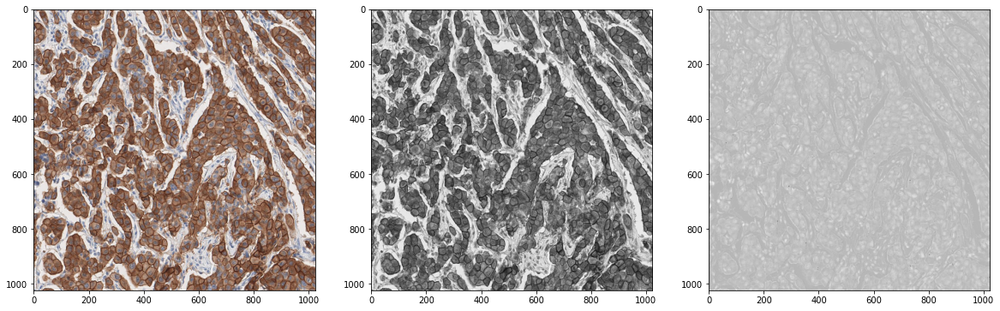

In [41]:
plt.figure(figsize= (20, 10))
plt.subplot(1, 3, 1)
plt.imshow(img)

plt.subplot(1, 3, 2)
plt.imshow(g, cmap = 'gray')

plt.subplot(1, 3, 3)
# plt.imshow(h, cmap = 'gray')
plt.imshow(h_n, cmap = 'gray')
plt.show()

In [21]:
len(dataset_train)

1784

In [42]:
img = img / 255.0
img = img.astype('float32')

g = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

g.max(), g.min(), g.mean()

(1.0, 0.06992157, 0.55779624)

In [43]:
hed = skimage.color.separate_stains(img, skimage.color.hed_from_rgb)
h = hed[:,:,0]

h.max(), h.min(), h.mean()

(0.19207388598289626, -0.4576081977409267, 0.029599278966247942)

In [47]:
img.dtype, g.dtype, h_n.dtype

(dtype('float32'), dtype('float32'), dtype('float64'))

In [44]:
img.max(), img.min(), img.mean()

(1.0, 0.0, 0.55258495)

DAB, hematoxylin color space (histogram)

1190


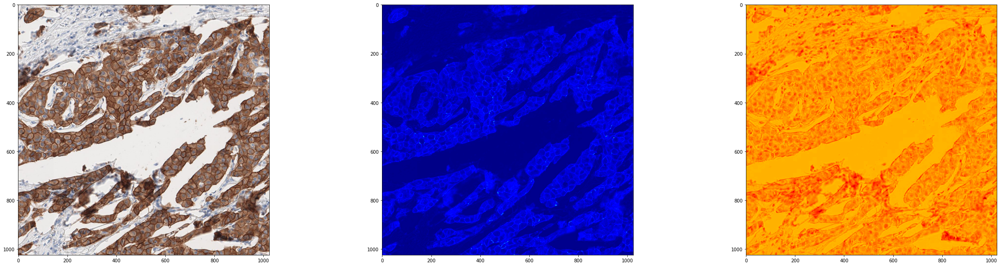

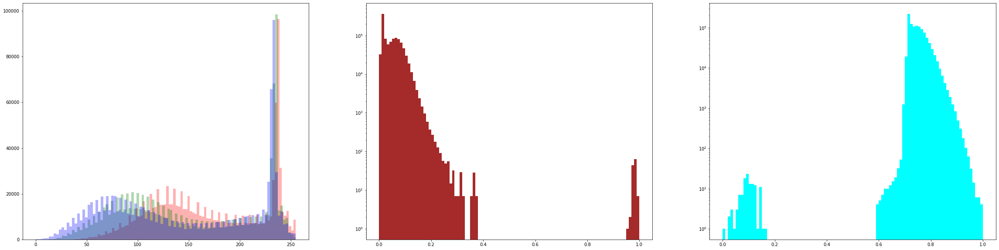

In [169]:
i = np.random.randint(len(samsung_data))
# i = 368
# i = 573
# i = 1053
print(i)
img = samsung_data[i]

g = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

hed = skimage.color.separate_stains(img, skimage.color.hed_from_rgb)
h = hed[:,:,0]
d = hed[:,:,2]

h_n = (h - h.min())/(h.max()-h.min())
d_n = (d - d.min())/(d.max()-d.min())

plt.figure(figsize= (40, 10))
plt.subplot(1, 3, 1)
plt.imshow(img)

plt.subplot(1, 3, 2)
plt.imshow(d_n, cmap = 'jet')

plt.subplot(1, 3, 3)
plt.imshow(h_n, cmap = 'jet')
plt.show()

plt.figure(figsize= (40, 10))
plt.subplot(1, 3, 1)

kwargs = dict(bins = 100, alpha = 0.3)
plt.hist(np.ravel(img[:,:,0]), color = 'r', **kwargs)
plt.hist(np.ravel(img[:,:,1]), color = 'g', **kwargs)
plt.hist(np.ravel(img[:,:,2]), color = 'b', **kwargs)
# plt.yscale('log')

plt.subplot(1, 3, 2)
plt.hist(np.ravel(d_n), color = 'brown', bins = 100)
plt.yscale('log')

plt.subplot(1, 3, 3)
plt.hist(np.ravel(h_n), color = 'cyan', bins = 100)
plt.yscale('log')
plt.show()

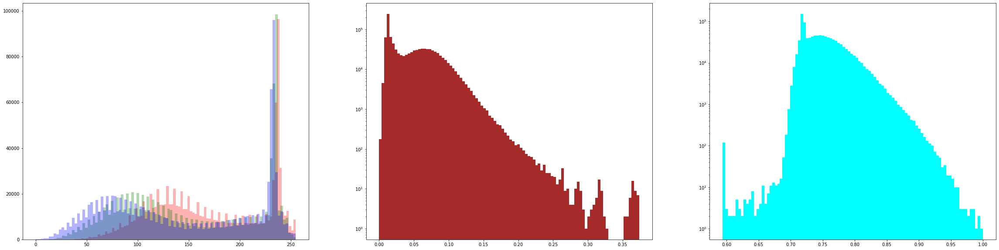

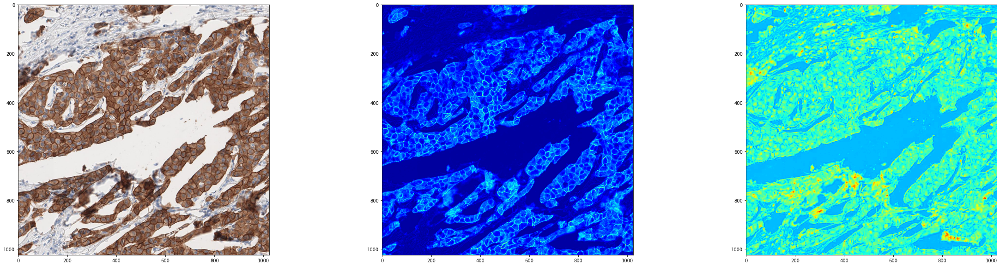

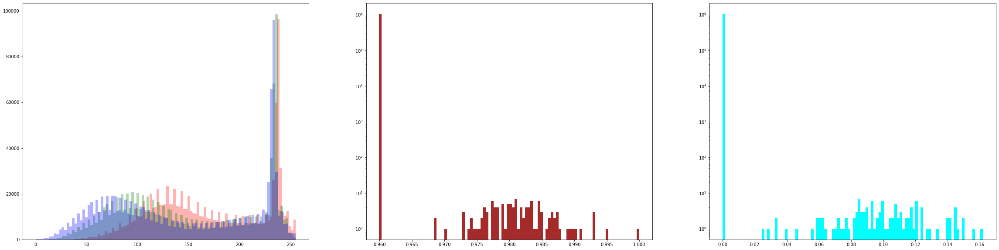

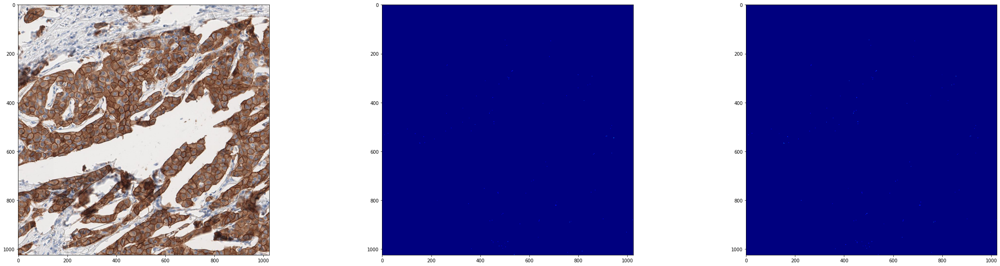

In [170]:
def img_overORbelow_value(img, ineq = img > 0):
    img_idx = np.where(ineq)
    img_min = np.min(np.ravel(img[img_idx]))
    img_ = img_min*np.ones(img.shape)
    # img_ = np.zeros(img.shape)
    img_[img_idx] = img[img_idx]
    return img_

d_major = img_overORbelow_value(d_n, ineq = d_n < 0.6)
d_minor = img_overORbelow_value(d_n, ineq = d_n >= 0.6)

h_major = img_overORbelow_value(h_n, ineq = h_n > 0.5)
h_minor = img_overORbelow_value(h_n, ineq = h_n <= 0.5)

plt.figure(figsize= (40, 10))
plt.subplot(1, 3, 1)

kwargs = dict(bins = 100, alpha = 0.3)
plt.hist(np.ravel(img[:,:,0]), color = 'r', **kwargs)
plt.hist(np.ravel(img[:,:,1]), color = 'g', **kwargs)
plt.hist(np.ravel(img[:,:,2]), color = 'b', **kwargs)
# plt.yscale('log')

plt.subplot(1, 3, 2)
plt.hist(np.ravel(d_major), color = 'brown', bins = 100)
plt.yscale('log')

plt.subplot(1, 3, 3)
plt.hist(np.ravel(h_major), color = 'cyan', bins = 100)
plt.yscale('log')
plt.show()

plt.figure(figsize= (40, 10))
plt.subplot(1, 3, 1)
plt.imshow(img)

plt.subplot(1, 3, 2)
plt.imshow(d_major, cmap = 'jet')

plt.subplot(1, 3, 3)
plt.imshow(h_major, cmap = 'jet')
plt.show()

plt.figure(figsize= (40, 10))
plt.subplot(1, 3, 1)

kwargs = dict(bins = 100, alpha = 0.3)
plt.hist(np.ravel(img[:,:,0]), color = 'r', **kwargs)
plt.hist(np.ravel(img[:,:,1]), color = 'g', **kwargs)
plt.hist(np.ravel(img[:,:,2]), color = 'b', **kwargs)
# plt.yscale('log')

plt.subplot(1, 3, 2)
plt.hist(np.ravel(d_minor), color = 'brown', bins = 100)
plt.yscale('log')

plt.subplot(1, 3, 3)
plt.hist(np.ravel(h_minor), color = 'cyan', bins = 100)
plt.yscale('log')
plt.show()

plt.figure(figsize= (40, 10))
plt.subplot(1, 3, 1)
plt.imshow(img)

plt.subplot(1, 3, 2)
plt.imshow(d_minor, cmap = 'jet')

plt.subplot(1, 3, 3)
plt.imshow(h_minor, cmap = 'jet')
plt.show()

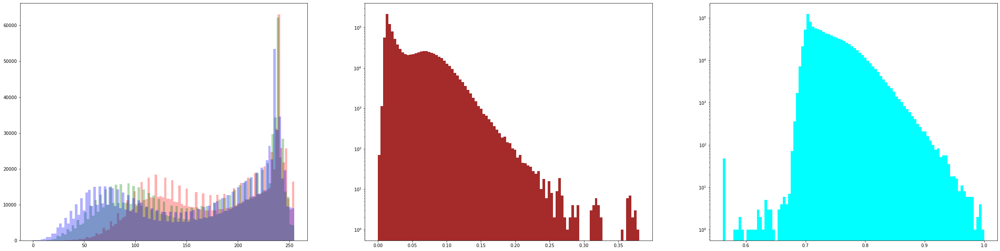

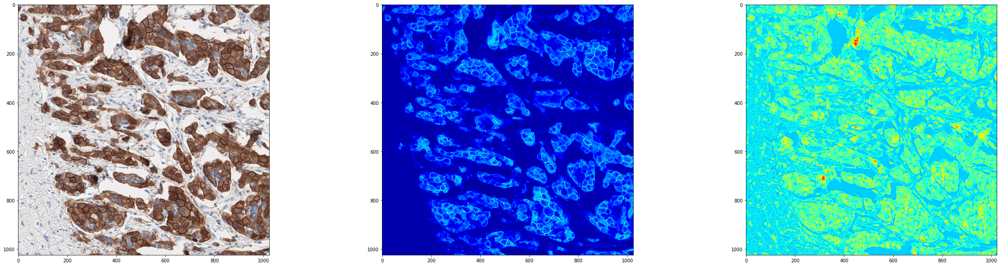

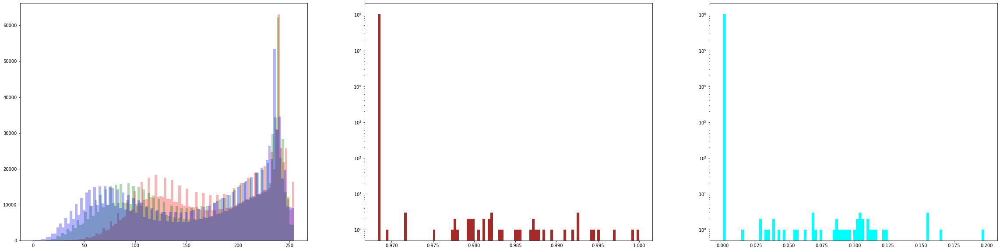

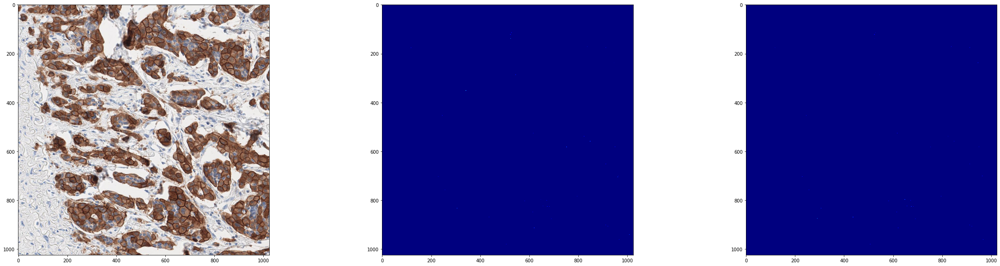

In [167]:
def img_overORbelow_value(img, ineq = img > 0):
    img_idx = np.where(ineq)
    img_min = np.min(np.ravel(img[img_idx]))
    img_ = img_min*np.ones(img.shape)
    # img_ = np.zeros(img.shape)
    img_[img_idx] = img[img_idx]
    return img_

d_major = img_overORbelow_value(d_n, ineq = d_n < 0.6)
d_minor = img_overORbelow_value(d_n, ineq = d_n >= 0.6)

h_major = img_overORbelow_value(h_n, ineq = h_n > 0.5)
h_minor = img_overORbelow_value(h_n, ineq = h_n <= 0.5)

plt.figure(figsize= (40, 10))
plt.subplot(1, 3, 1)

kwargs = dict(bins = 100, alpha = 0.3)
plt.hist(np.ravel(img[:,:,0]), color = 'r', **kwargs)
plt.hist(np.ravel(img[:,:,1]), color = 'g', **kwargs)
plt.hist(np.ravel(img[:,:,2]), color = 'b', **kwargs)
# plt.yscale('log')

plt.subplot(1, 3, 2)
plt.hist(np.ravel(d_major), color = 'brown', bins = 100)
plt.yscale('log')

plt.subplot(1, 3, 3)
plt.hist(np.ravel(h_major), color = 'cyan', bins = 100)
plt.yscale('log')
plt.show()

plt.figure(figsize= (40, 10))
plt.subplot(1, 3, 1)
plt.imshow(img)

plt.subplot(1, 3, 2)
plt.imshow(d_major, cmap = 'jet')

plt.subplot(1, 3, 3)
plt.imshow(h_major, cmap = 'jet')
plt.show()

plt.figure(figsize= (40, 10))
plt.subplot(1, 3, 1)

kwargs = dict(bins = 100, alpha = 0.3)
plt.hist(np.ravel(img[:,:,0]), color = 'r', **kwargs)
plt.hist(np.ravel(img[:,:,1]), color = 'g', **kwargs)
plt.hist(np.ravel(img[:,:,2]), color = 'b', **kwargs)
# plt.yscale('log')

plt.subplot(1, 3, 2)
plt.hist(np.ravel(d_minor), color = 'brown', bins = 100)
plt.yscale('log')

plt.subplot(1, 3, 3)
plt.hist(np.ravel(h_minor), color = 'cyan', bins = 100)
plt.yscale('log')
plt.show()

plt.figure(figsize= (40, 10))
plt.subplot(1, 3, 1)
plt.imshow(img)

plt.subplot(1, 3, 2)
plt.imshow(d_minor, cmap = 'jet')

plt.subplot(1, 3, 3)
plt.imshow(h_minor, cmap = 'jet')
plt.show()

In [154]:
h_major.min()

0.0

hematoxylin thresholding

1122


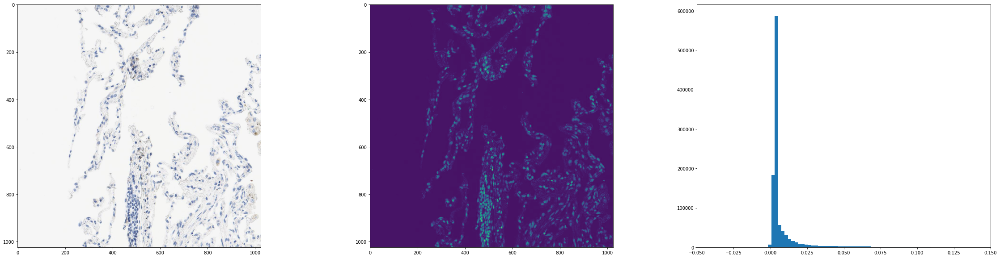

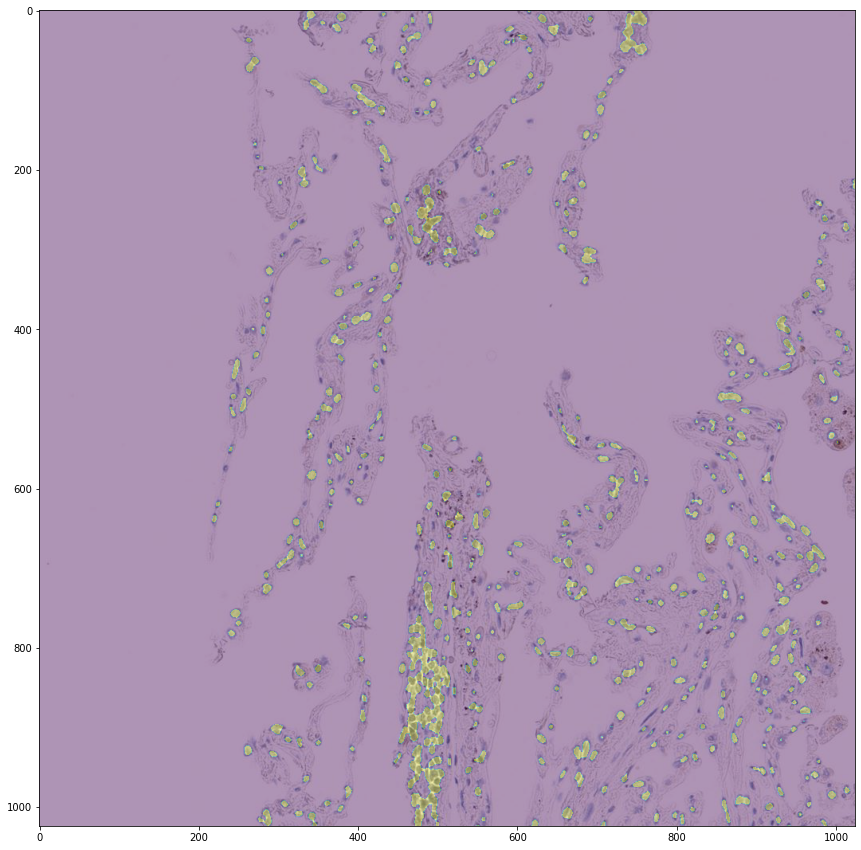

In [103]:
i = np.random.randint(len(samsung_data))
# i = 962
print(i)

img = samsung_data[i]

g = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

hed = skimage.color.separate_stains(img, skimage.color.hed_from_rgb)
h = hed[:,:,0]
d = hed[:,:,2]

_, mask_h = cv2.threshold(h, 0.04, 1, cv2.THRESH_BINARY)
mask_h = mask_h.astype('uint8')
mask_h = cv2.medianBlur(mask_h, 7,7)

h_n = (h- h.min())/(h.max()-h.min())

plt.figure(figsize= (40, 10))
plt.subplot(1, 3, 1)
plt.imshow(img)

plt.subplot(1, 3, 2)
plt.imshow(h)

plt.subplot(1, 3, 3)
plt.hist(np.ravel(h), bins = 100)
plt.xlim([-0.05, 0.15])

plt.figure(figsize= (15, 15))
plt.imshow(img)
plt.imshow(mask_h, alpha = 0.4)
plt.show()

## 2. h_min,  h_max = -0.66781543,  1.87798274 

sample dataset

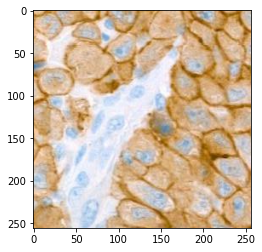

In [12]:
fn_tonumpy = lambda x : x.to('cpu').detach().numpy().transpose(1, 2, 0)
fn_denorm = lambda x, mean, std : (x*std) + mean

i = np.random.randint(len(dataset_train))
img = fn_denorm(fn_tonumpy(inputs[i]), mean=0.5, std=0.5)
lab = fn_tonumpy(label[i])

plt.imshow(img)
plt.show()

In [16]:
import cv2
import skimage.color

g = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

hed = skimage.color.separate_stains(img, skimage.color.hed_from_rgb)
h = hed[:,:,0]

h_min,  h_max = -0.66781543,  1.87798274
h_n = (h-h_min)/(h_max-h_min)

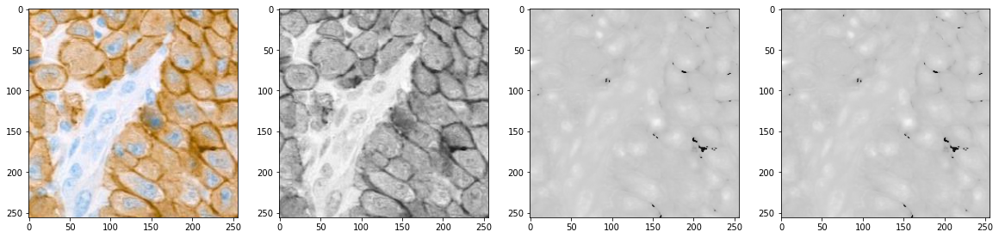

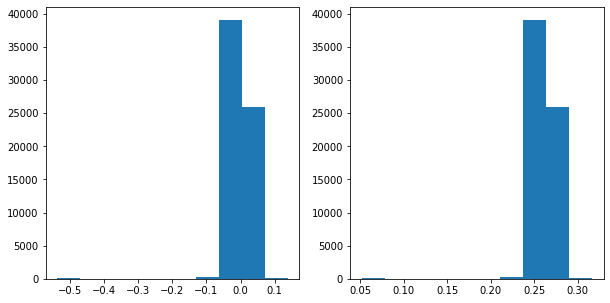

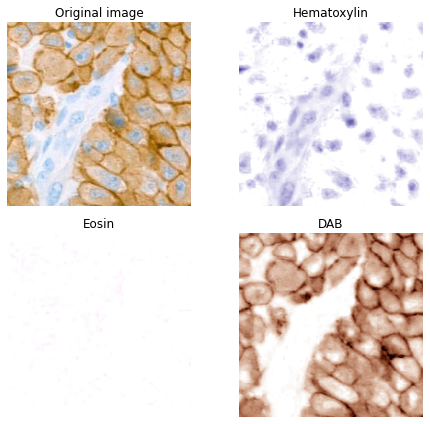

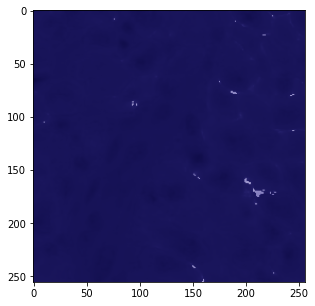

In [23]:
plt.figure(figsize= (20, 10))
plt.subplot(1, 4, 1)
plt.imshow(img)

plt.subplot(1, 4, 2)
plt.imshow(g, cmap = 'gray')

plt.subplot(1, 4, 3)
plt.imshow(h, cmap = 'gray')

plt.subplot(1, 4, 4)
plt.imshow(h_n, cmap = 'gray')
plt.show()

plt.figure(figsize = (10, 5))
plt.subplot(1, 2, 1)
plt.hist(h.ravel())
plt.subplot(1, 2, 2)
plt.hist(h_n.ravel())
plt.show()

from skimage.color import hed2rgb

ihc_rgb = img
ihc_hed = hed

null = np.zeros_like(ihc_hed[:, :, 0])
ihc_h = hed2rgb(np.stack((ihc_hed[:, :, 0], null, null), axis=-1))
ihc_e = hed2rgb(np.stack((null, ihc_hed[:, :, 1], null), axis=-1))
ihc_d = hed2rgb(np.stack((null, null, ihc_hed[:, :, 2]), axis=-1))

# Display
fig, axes = plt.subplots(2, 2, figsize=(7, 6), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(ihc_rgb)
ax[0].set_title("Original image")

ax[1].imshow(ihc_h)
ax[1].set_title("Hematoxylin")

ax[2].imshow(ihc_e)
ax[2].set_title("Eosin")  # Note that there is no Eosin stain in this image

ax[3].imshow(ihc_d)
ax[3].set_title("DAB")

for a in ax.ravel():
    a.axis('off')

fig.tight_layout()


ihc_h_n = hed2rgb(np.stack((h_n, null, null), axis=-1))

plt.figure(figsize = (5, 5))
plt.imshow(ihc_h_n)
plt.show()

samsung dataset

In [24]:
samsung_data_dir = '/mnt/hdd1/c-MET_datasets/SLIDE_DATA/록원재단/AT2/C-MET_slide/patch_on_ROI/sobel+blurrity_check/S-LC0007-MET/200x'

def get_img_list(data_dir):
    img_files = [i for i in sorted(os.listdir(data_dir)) if os.path.isfile(os.path.join(data_dir, i))]
    return sorted(img_files)

def get_image(data_dir, data_list):
    imgs = []
    for file in data_list:
        imgs.append(np.array(Image.open(os.path.join(data_dir, file)).convert('RGB')))
    return imgs

samsung_data_list = get_img_list(samsung_data_dir)
samsung_data = get_image(samsung_data_dir, samsung_data_list)

984


Text(0.5, 1.0, 'DAB')

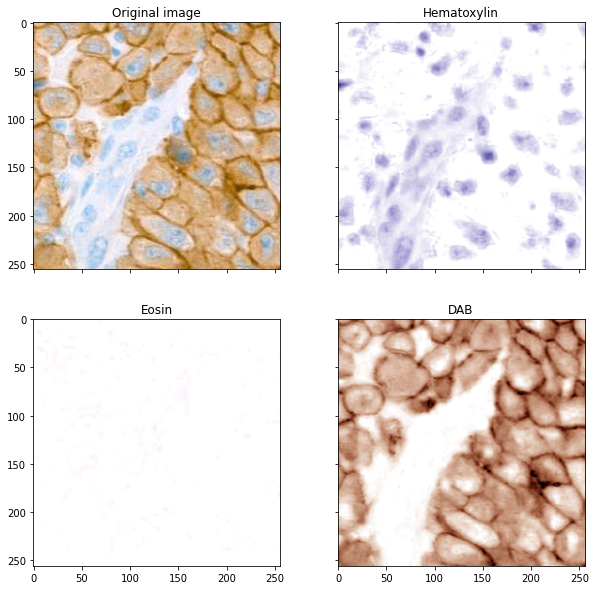

In [28]:
from skimage.color import hed2rgb

i = np.random.randint(len(samsung_data))
print(i)

ihc_rgb = img
ihc_hed = skimage.color.separate_stains(img, skimage.color.hed_from_rgb)

null = np.zeros_like(ihc_hed[:, :, 0])
ihc_h = hed2rgb(np.stack((ihc_hed[:, :, 0], null, null), axis=-1))
ihc_e = hed2rgb(np.stack((null, ihc_hed[:, :, 1], null), axis=-1))
ihc_d = hed2rgb(np.stack((null, null, ihc_hed[:, :, 2]), axis=-1))

# Display
fig, axes = plt.subplots(2, 2, figsize=(10, 10), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(ihc_rgb)
ax[0].set_title("Original image")

ax[1].imshow(ihc_h)
ax[1].set_title("Hematoxylin")

ax[2].imshow(ihc_e)
ax[2].set_title("Eosin")  # Note that there is no Eosin stain in this image

ax[3].imshow(ihc_d)
ax[3].set_title("DAB")

In [ ]:
i = np.random.randint(len(samsung_data))
# i = 368
# i = 573
# i = 1053
print(i)
img = samsung_data[i]

g = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

hed = skimage.color.separate_stains(img, skimage.color.hed_from_rgb)
h = hed[:,:,0]
d = hed[:,:,2]

h_n = (h - h.min())/(h.max()-h.min())
d_n = (d - d.min())/(d.max()-d.min())

plt.figure(figsize= (40, 10))
plt.subplot(1, 3, 1)
plt.imshow(img)

plt.subplot(1, 3, 2)
plt.imshow(d_n, cmap = 'jet')

plt.subplot(1, 3, 3)
plt.imshow(h_n, cmap = 'jet')
plt.show()

plt.figure(figsize= (40, 10))
plt.subplot(1, 3, 1)

kwargs = dict(bins = 100, alpha = 0.3)
plt.hist(np.ravel(img[:,:,0]), color = 'r', **kwargs)
plt.hist(np.ravel(img[:,:,1]), color = 'g', **kwargs)
plt.hist(np.ravel(img[:,:,2]), color = 'b', **kwargs)
# plt.yscale('log')

plt.subplot(1, 3, 2)
plt.hist(np.ravel(d_n), color = 'brown', bins = 100)
# plt.yscale('log')

plt.subplot(1, 3, 3)
plt.hist(np.ravel(h_n), color = 'cyan', bins = 100)
# plt.yscale('log')
plt.show()

# Only Hematoxylin RGB image

In [5]:
import os
import numpy as np
from PIL import Image

samsung_data_dir = '/mnt/hdd1/c-MET_datasets/SLIDE_DATA/록원재단/AT2/C-MET_slide/patch_on_ROI/sobel+blurrity_check/S-LC0007-MET/200x'

def get_image(data_dir):
    img_files = [i for i in sorted(os.listdir(data_dir)) if os.path.isfile(os.path.join(data_dir, i))]
    imgs = []
    for file in img_files:
        imgs.append(np.array(Image.open(os.path.join(data_dir, file)).convert('RGB')))
    return img_files, imgs

files, imgs = get_image(samsung_data_dir)

In [3]:
import skimage.color

def H_RGB(rgb_image):
    """
    Arg:
        rgb_image = An Original RGB image, {0, 1}, dtype = np.float32

    Return:
        ihc_h = A RGB image of Hematoxyling to the corresponding original rgb image, {0, 1}, dtype = np.float32
    """

    h = skimage.color.separate_stains(rgb_image, skimage.color.hed_from_rgb)[:, :, 0]
    null = np.zeros_like(h)
    ihc_h = skimage.color.combine_stains(np.stack((h, null, null), axis = -1), skimage.color.rgb_from_hed)
    return ihc_h.astype('float32')

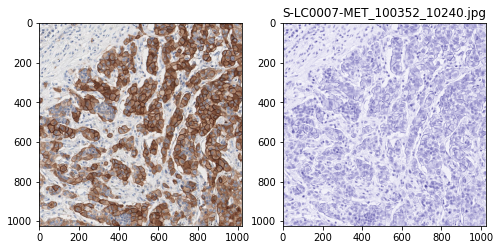

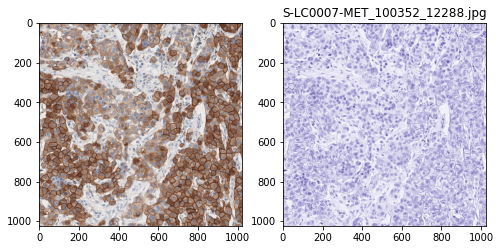

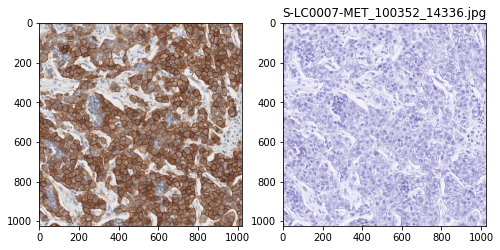

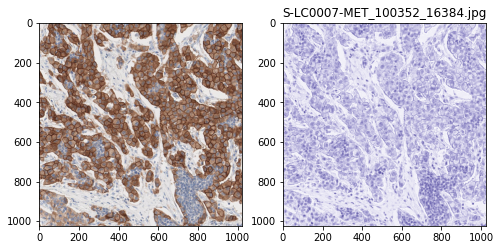

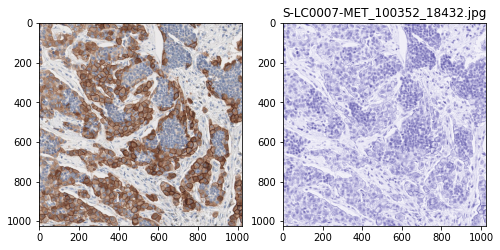

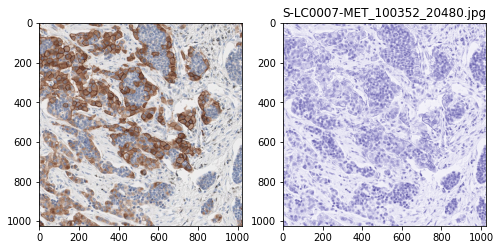

In [7]:
import matplotlib.pyplot as plt

for i, (file, img) in enumerate(zip(files, imgs)):

    h = H_RGB(img)

    fig, ax = plt.subplots(1, 2, figsize = (8, 5))
    plt.title(file)
    ax[0].imshow(img)
    ax[1].imshow(h)
    fig.show()

    if i == 5:
        break

In [8]:
h.max(), h.min(), h.dtype

(1.0, 0.013561844, dtype('float32'))